In [ ]:
import random
import zipfile
from pathlib import Path
import numpy as np

import matplotlib.patches as patches
import matplotlib.pyplot as plt
import matplotlib.image as mpim
from PIL import Image

ARCHIVE_PATH = Path('/content/HERIDAL-YOLO.v2i.yolov8.zip')
EXTRACT_DIR = Path('/content/data/heridal_yolo')


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!cp "/content/drive/MyDrive/Colab Notebooks/HERIDAL-YOLO.v2i.yolov8.zip" "/content/"

In [ ]:
def prepare_dataset(archive_path: Path, extract_dir: Path) -> Path:
    if not archive_path.exists():
        raise FileNotFoundError(f'Не найден архив: {archive_path.resolve()}')
    if not zipfile.is_zipfile(archive_path):
        raise RuntimeError('Архив пока невалидный как zip. Дождись окончания загрузки файла и запусти снова.')

    if not extract_dir.exists():
        extract_dir.mkdir(parents=True, exist_ok=True)
        with zipfile.ZipFile(archive_path, 'r') as zf:
            zf.extractall(extract_dir)

    yaml_candidates = list(extract_dir.rglob('data.yaml'))
    if len(yaml_candidates) == 0:
        raise RuntimeError('В распакованном датасете не найден data.yaml')

    return yaml_candidates[0].parent

In [ ]:
def read_data_yaml(yaml_path: Path):
    names = {}
    for line in yaml_path.read_text(encoding='utf-8', errors='ignore').splitlines():
        line = line.strip()
        if line.startswith('- '):
            idx = len(names)
            names[idx] = line[2:].strip().strip('"').strip("'")
        elif ':' in line and line.split(':', 1)[0].strip().isdigit():
            idx_str, val = line.split(':', 1)
            names[int(idx_str.strip())] = val.strip().strip('"').strip("'")
    if len(names) == 0:
        names = {0: 'person'}
    return names

In [ ]:
def parse_yolo_label(label_path: Path):
    boxes = []
    if not label_path.exists():
        return boxes

    for line in label_path.read_text(encoding='utf-8', errors='ignore').splitlines():
        parts = line.strip().split()
        if len(parts) != 5:
            continue
        class_id = int(float(parts[0]))
        x_center = float(parts[1])
        y_center = float(parts[2])
        width = float(parts[3])
        height = float(parts[4])
        boxes.append((class_id, x_center, y_center, width, height))
    return boxes

In [ ]:
# TODO: реализовать перевод YOLO-координат (x_center, y_center, width, height) в пиксели (x1, y1, x2, y2)
# TODO: вернуть class_id и координаты бокса в формате class_id, x1, y1, x2, y2
def yolo_to_xyxy(box, image_w, image_h):
 class_id, x_center, y_center, width, height = box

 x1_left = x_center - (width / 2)
 y1_left = y_center - (height / 2)
 x2_right = x_center + (width / 2)
 y2_right = y_center + (height / 2)

 x1 = int(x1_left * image_w)
 y1 = int(y1_left * image_h)
 x2 = int(x2_right * image_w)
 y2 = int(y2_right * image_h)
 return class_id, x1, y1, x2, y2


In [ ]:
def collect_split_stats(dataset_root: Path, split: str):
    images_dir = dataset_root / split / 'images'
    labels_dir = dataset_root / split / 'labels'

    image_extensions = ('*.jpg', '*.jpeg', '*.png', '*.JPG', '*.PNG')
    image_paths = []
    for ext in image_extensions:
        image_paths.extend(images_dir.glob(ext))

    total_images = len(image_paths)

    if total_images == 0:
        return {"split": split, "total_images": 0, "total_labels": 0, "missing_labels": 0, "avg_boxes_per_image": 0, "max_boxes_per_image": 0}

    total_labels = 0
    missing_labels = 0
    boxes_per_img = []

    for img_path in image_paths:
        label_path = labels_dir / f"{img_path.stem}.txt"

        if not label_path.exists():
            missing_labels += 1
            boxes_per_img.append(0)
        else:
            total_labels += 1
            boxes = parse_yolo_label(label_path)
            boxes_per_img.append(len(boxes))

    avg_boxes = sum(boxes_per_img) / len(boxes_per_img) if boxes_per_img else 0
    max_boxes = max(boxes_per_img) if boxes_per_img else 0

    return {
        "split": split,
        "total_images": total_images,
        "total_labels": total_labels,
        "missing_labels": missing_labels,
        "boxes_per_img": boxes_per_img,
        "avg_boxes_per_image": round(avg_boxes, 2),
        "max_boxes_per_image": max_boxes
    }

In [ ]:
def print_dataset_overview(dataset_root: Path, class_names: dict):
    print(f"Классы: {list(class_names.values())}\n")
    for split in ['train', 'valid', 'test']:
        split_dir = dataset_root / split
        if not split_dir.exists():
            print(f"Папка {split}/ не найдена, пропуск.\n")
            continue

        stats = collect_split_stats(dataset_root, split)
        boxes_arr = stats["boxes_per_img"]

        print(f"Split: {split}")
        print(f"Изображений: {stats['total_images']}")
        print(f"Файлов разметки: {stats['total_labels']}")
        print(f"Без разметки (missing): {stats['missing_labels']}")
        if boxes_arr:
            print(f"Всего объектов: {sum(boxes_arr)}")
            print(f"Среднее на кадр: {sum(boxes_arr)/len(boxes_arr):.2f}")
            print(f"Максимум на кадр: {max(boxes_arr)}")
        else:
            print("   Объекты не найдены.")

In [ ]:
def show_examples(dataset_root: Path, class_names: dict, split='train', n=6, seed=42):
    images_dir = dataset_root / split / 'images'
    labels_dir = dataset_root / split / 'labels'

    image_paths = sorted(list(images_dir.glob('*.*')))
    if len(image_paths) == 0:
        raise RuntimeError(f'В {images_dir} не найдено изображений')

    random.seed(seed)
    chosen = random.sample(image_paths, min(n, len(image_paths)))

    cols = 3
    rows = (len(chosen) + cols - 1) // cols
    plt.figure(figsize=(15, 5 * rows))

    for i, img_path in enumerate(chosen, start=1):
        label_path = labels_dir / f'{img_path.stem}.txt'

        with Image.open(img_path) as image:
            image = image.convert('RGB')
            image_w, image_h = image.size
            boxes = parse_yolo_label(label_path)

            ax = plt.subplot(rows, cols, i)
            ax.imshow(image)
            ax.set_title(f'{split}: | боксов: {len(boxes)}')
            ax.axis('off')

            for box in boxes:
                class_id, x1, y1, x2, y2 = yolo_to_xyxy(box, image_w, image_h)
                rect = patches.Rectangle(
                    (x1, y1),
                    x2 - x1,
                    y2 - y1,
                    linewidth=2,
                    edgecolor='lime',
                    facecolor='none',
                )
                ax.add_patch(rect)
                class_name = class_names.get(class_id, f'class_{class_id}')
                ax.text(
                    x1,
                    max(0, y1 - 3),
                    class_name,
                    color='black',
                    fontsize=9,
                    bbox=dict(facecolor='lime', alpha=0.7),
                )

    plt.tight_layout()
    plt.show()


In [ ]:
!pip install -U ultralytics

Классы: ['person']

Split: train
Изображений: 3246
Файлов разметки: 3246
Без разметки (missing): 0
Всего объектов: 5658
Среднее на кадр: 1.74
Максимум на кадр: 35
Split: valid
Изображений: 310
Файлов разметки: 310
Без разметки (missing): 0
Всего объектов: 720
Среднее на кадр: 2.32
Максимум на кадр: 33
Split: test
Изображений: 154
Файлов разметки: 154
Без разметки (missing): 0
Всего объектов: 286
Среднее на кадр: 1.86
Максимум на кадр: 16
Ссылка на документацию по обучению YOLO:
https://docs.ultralytics.com/modes/train/

Команды для Google Colab:
pip install -U ultralytics
А остальное найти в статье ;)


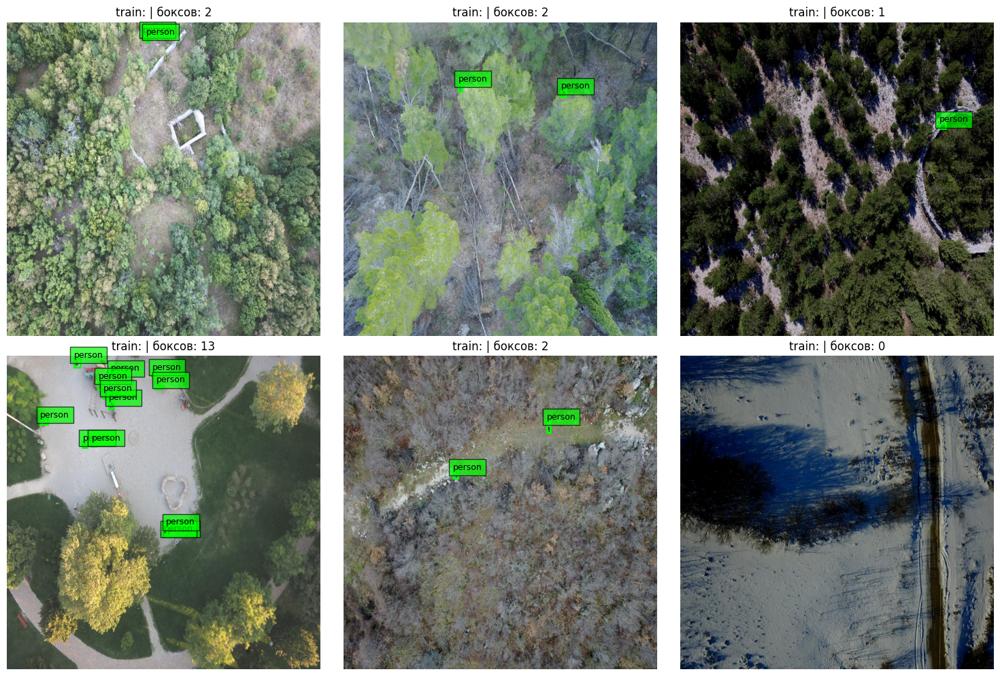

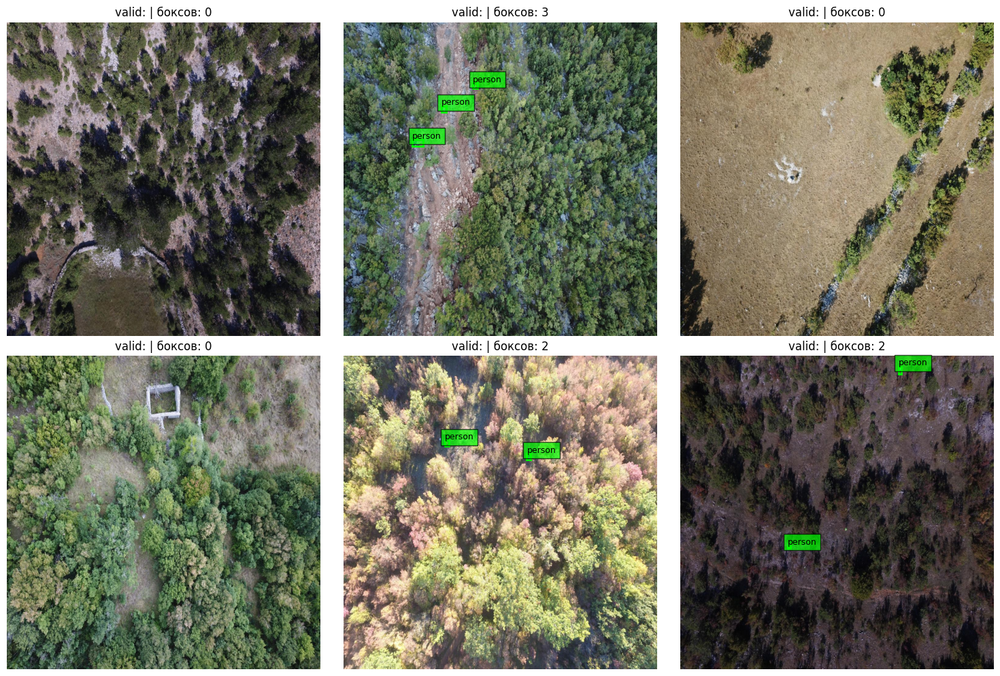

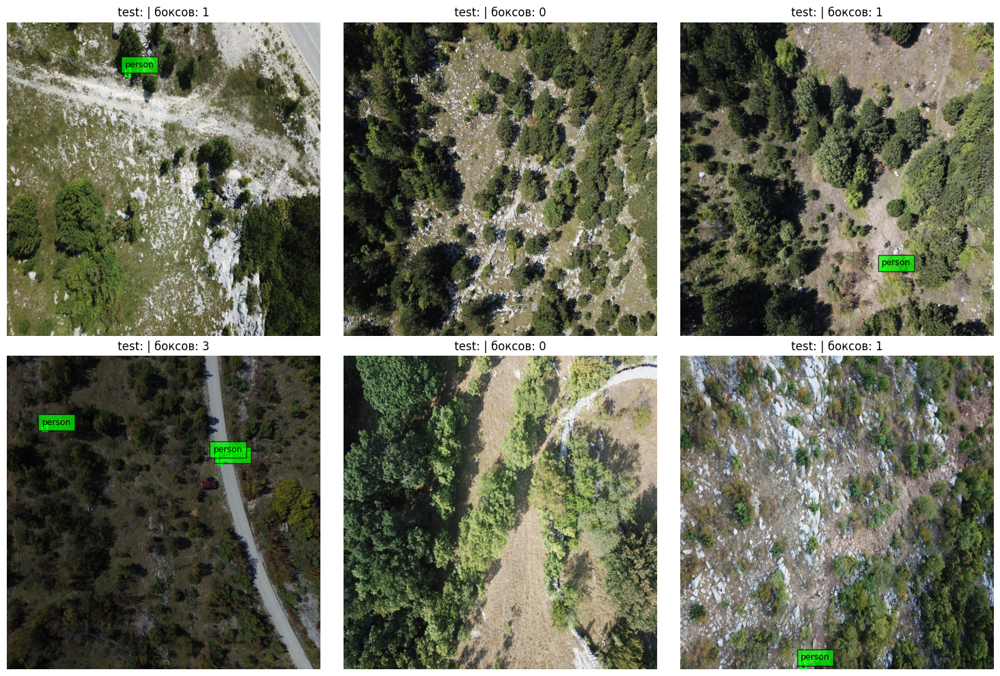

In [ ]:
def main():
    dataset_root = prepare_dataset(ARCHIVE_PATH, EXTRACT_DIR)
    class_names = read_data_yaml(dataset_root / 'data.yaml')

    print_dataset_overview(dataset_root, class_names)

    show_examples(dataset_root, class_names, split='train', n=6, seed=42)
    show_examples(dataset_root, class_names, split='valid', n=6, seed=43)
    show_examples(dataset_root, class_names, split='test', n=6, seed=44)


if __name__ == '__main__':
    main()


In [ ]:
from ultralytics import YOLO
model = YOLO('yolov8n.pt')
results = model.train(
    data='data/heridal_yolo/data.yaml',
    epochs=30,
    imgsz=640,
    batch=16,
    device=0,
    project='heridal_object_detection',
    name='yolov8n_baseline'
)

Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data/heridal_yolo/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8n_baseline-2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patie

Графики есть


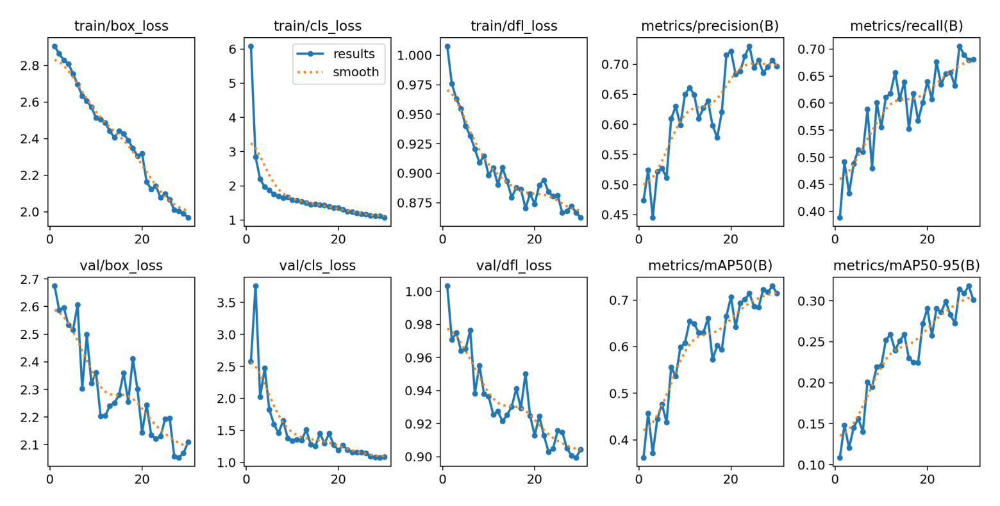

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.image as mpimg
results_png = Path('runs/detect/heridal_object_detection/yolov8n_baseline-2/results.png')

if results_png.exists():
    print("Графики есть")

    img = mpimg.imread(results_png)
    plt.figure(figsize=(20, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    from google.colab import files
    files.download(str(results_png))


In [ ]:
model = YOLO('runs/detect/heridal_object_detection/yolov8n_baseline-2/weights/best.pt')

results = model.predict(
    source='data/heridal_yolo/test/images',
    conf=0.25,
    save=True,
    project='runs/detect',
    name='test_inference'
)

print(f"ИРезультаты в: runs/detect/test_inference/")


image 1/154 /content/data/heridal_yolo/test/images/train_BRA_1002_JPG.rf.07a8199628b09a6d47d9b43be19712bb.jpg: 640x640 (no detections), 7.2ms
image 2/154 /content/data/heridal_yolo/test/images/train_BRA_1003_JPG.rf.14fc93d1421f25f61b7387a81dfb7487.jpg: 640x640 (no detections), 7.2ms
image 3/154 /content/data/heridal_yolo/test/images/train_BRA_1006_JPG.rf.c14c76eae0e8bf50b1124722d9278081.jpg: 640x640 (no detections), 7.2ms
image 4/154 /content/data/heridal_yolo/test/images/train_BRA_1016_JPG.rf.6e5d4f9650fb964e4e05ba238c86ba92.jpg: 640x640 1 human, 7.2ms
image 5/154 /content/data/heridal_yolo/test/images/train_BRA_1017_JPG.rf.03be1b8c8ef103b4abc78f20985816db.jpg: 640x640 1 human, 7.2ms
image 6/154 /content/data/heridal_yolo/test/images/train_BRA_1039_JPG.rf.11b96a843fb849cbb5a27e02054b2d14.jpg: 640x640 (no detections), 7.2ms
image 7/154 /content/data/heridal_yolo/test/images/train_BRA_1071_JPG.rf.0d112a6a3817c8fad53e824075da9061.jpg: 640x640 4 humans, 7.2ms
image 8/154 /content/data/he